In [1]:
import os
import netCDF4
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
from heatmap import corrplot # SOURCE: https://github.com/dylan-profiler/heatmaps/blob/master/heatmap/heatmap.py

In [2]:
PARAM_DATE = '2019-01-01'
PARAM_MODIS_RES = 'L2'
PARAM_MODIS_SATELLITE = 'MYD04'  # 'MOD04' for Terra, 'MYD04' for Aqua

DATA_PATH = '../..'
H8_PARENT_DIR = 'H8_MODIS_2019-2020'
H8_MODIS_DIR = f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}'
H8_MODIS_FILENAME = f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}.nc'
MODIS_PARENT_DIR = 'MODIS_L2_Aus_2019-2020'
MODIS_FILENAME = f'{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}.nc'

H8_MODIS_PATH = os.path.join(DATA_PATH, H8_PARENT_DIR, H8_MODIS_DIR, H8_MODIS_FILENAME)
MODIS_PATH = os.path.join(DATA_PATH, MODIS_PARENT_DIR, MODIS_FILENAME)

In [3]:
df_H8 = xr.open_dataset(H8_MODIS_PATH).to_dataframe()
df_H8 = df_H8.drop(columns=['time','solar_azimuth_angle','solar_zenith_angle'])
df_MODIS = xr.open_dataset(MODIS_PATH).drop_dims(['corner','file']).to_dataframe()

df_H8_MODIS = pd.concat([df_H8, df_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined']], axis=1)

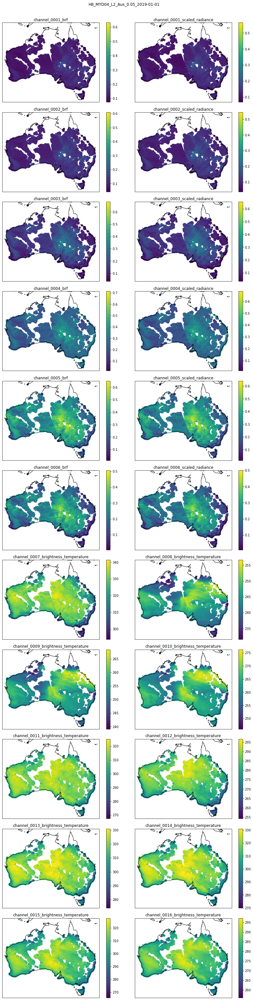

In [4]:
channel_list = [col for col in df_H8_MODIS.columns if col.startswith('channel')]

fig = plt.figure(figsize=(12,44))

for i, channel in enumerate(channel_list):
    ax = plt.subplot(11, 2, i+1, projection=ccrs.PlateCarree())
    sc = ax.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS[channel])
    ax.coastlines()
    fig.colorbar(sc, ax=ax)
    ax.set_title(channel)
    
fig.suptitle(f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}')
fig.tight_layout()
fig.subplots_adjust(top=0.96)

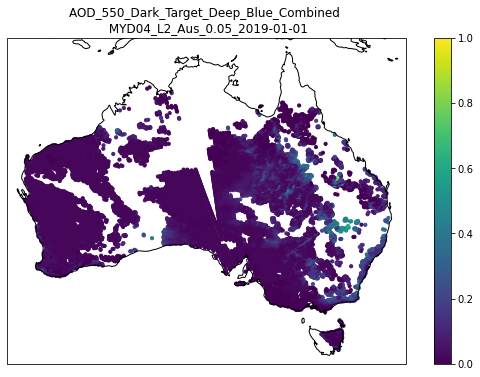

In [57]:
plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined'], vmin=0, vmax=1, s=10)
plt.colorbar()
ax.coastlines()
ax.set_title(f'AOD_550_Dark_Target_Deep_Blue_Combined \n {PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE}')
# plt.savefig(f'heatmap_AOD_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_{PARAM_DATE}.png', facecolor='white', bbox_inches='tight')
plt.show()

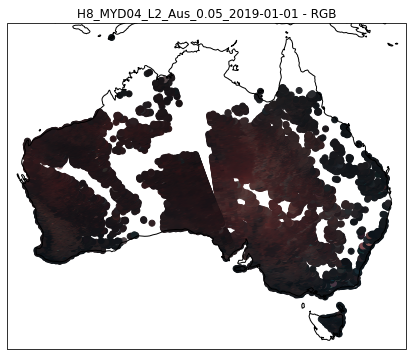

In [6]:
rgb = np.stack([df_H8_MODIS['channel_0003_scaled_radiance'], df_H8_MODIS['channel_0002_scaled_radiance'], df_H8_MODIS['channel_0001_scaled_radiance']], axis=1)
# rgb = np.stack([df_H8_MODIS['channel_0003_brf'], df_H8_MODIS['channel_0002_brf'], df_H8_MODIS['channel_0001_brf']], axis=1)

plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=rgb)
ax.coastlines()
ax.set_title(f'H8_{PARAM_MODIS_SATELLITE}_{PARAM_MODIS_RES}_Aus_0.05_{PARAM_DATE} - RGB')
plt.show()

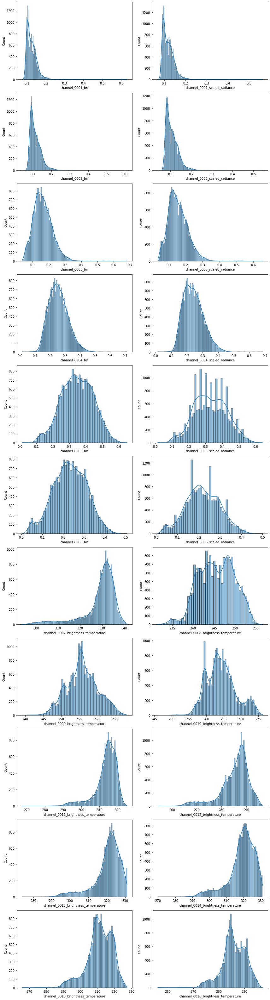

In [7]:
f, axs = plt.subplots(11, 2, figsize=(12,44))
for i, var in enumerate(channel_list):
    row = i//2
    col = i%2
    sns.histplot(data=df_H8_MODIS, x=var, kde=True, ax=axs[row, col])
f.tight_layout()

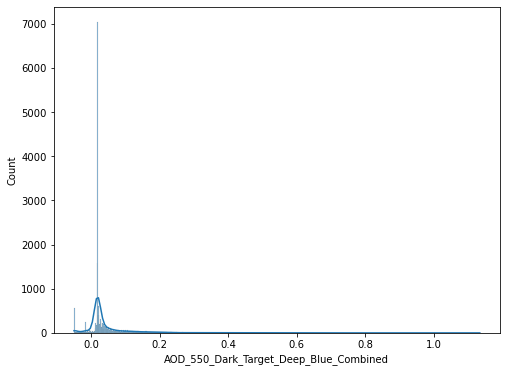

In [8]:
plt.figure(figsize=(8,6))
sns.histplot(data=df_H8_MODIS, x='AOD_550_Dark_Target_Deep_Blue_Combined', kde=True)
plt.show()

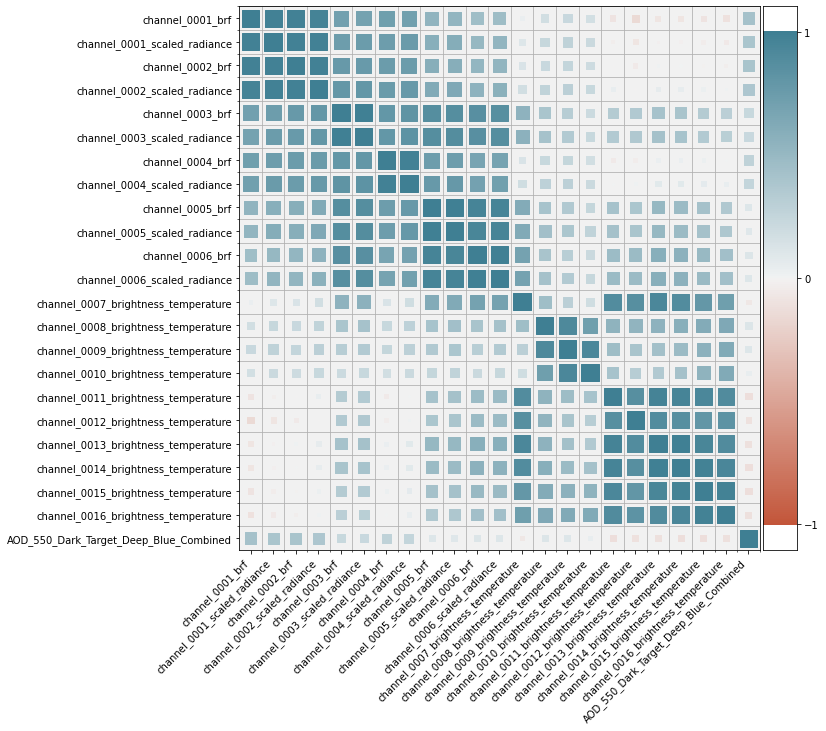

In [9]:
corr = df_H8_MODIS.drop(columns=['lat','lon']).corr()
plt.figure(figsize=(10,10))
corrplot(corr, size_scale=300)

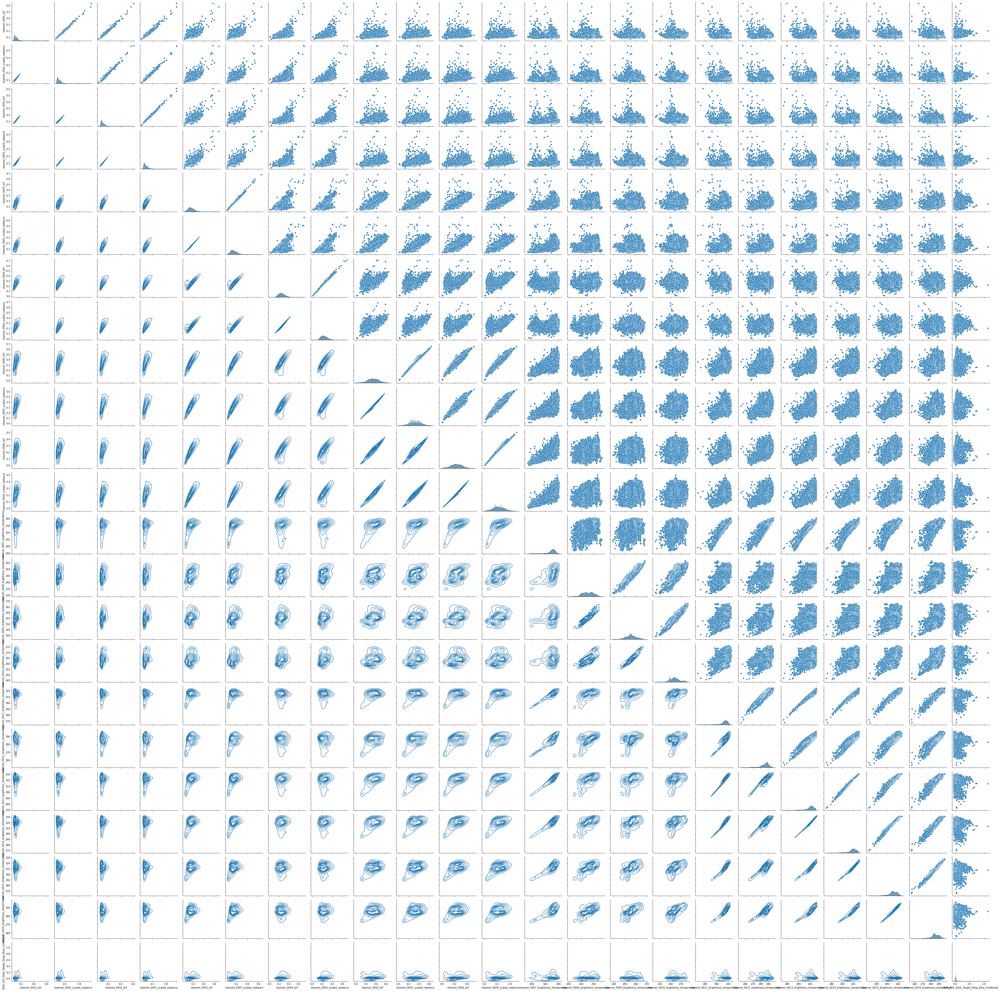

In [12]:
g = sns.PairGrid(df_H8_MODIS.drop(columns=['lat','lon']))
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.histplot, kde=True)

In [56]:
for i in range(31):
    print(xr.open_dataset(f'../../H8_MODIS_2019-2020/H8_MYD04_L2/H8_MYD04_L2_Aus_0.05_2019-01-{i+1:02}.nc').to_dataframe()['time'].min(), xr.open_dataset(f'../../H8_MODIS_2019-2020/H8_MYD04_L2/H8_MYD04_L2_Aus_0.05_2019-01-{i+1:02}.nc').to_dataframe()['time'].max())
    if (i%7==6):
        print()

2019-01-01 04:00:00 2019-01-01 05:50:00
2019-01-02 03:10:00 2019-01-02 06:30:00
2019-01-03 03:50:00 2019-01-03 05:35:00
2019-01-04 02:55:00 2019-01-04 06:15:00
2019-01-05 03:40:00 2019-01-05 06:55:00
2019-01-06 04:20:00 2019-01-06 06:05:00
2019-01-07 03:25:00 2019-01-07 06:45:00

2019-01-08 04:05:00 2019-01-08 05:55:00
2019-01-09 03:15:00 2019-01-09 06:35:00
2019-01-10 03:55:00 2019-01-10 05:40:00
2019-01-11 03:00:00 2019-01-11 06:25:00
2019-01-12 03:40:00 2019-01-12 07:00:00
2019-01-13 02:55:00 2019-01-13 06:10:00
2019-01-14 03:30:00 2019-01-14 06:55:00

2019-01-15 04:15:00 2019-01-15 06:00:00
2019-01-16 03:20:00 2019-01-16 06:40:00
2019-01-17 04:00:00 2019-01-17 05:45:00
2019-01-18 03:05:00 2019-01-18 06:30:00
2019-01-19 03:50:00 2019-01-19 05:35:00
2019-01-20 02:55:00 2019-01-20 06:15:00
2019-01-21 03:35:00 2019-01-21 07:00:00

2019-01-22 04:20:00 2019-01-22 06:05:00
2019-01-23 03:25:00 2019-01-23 06:45:00
2019-01-24 04:05:00 2019-01-24 05:50:00
2019-01-25 03:15:00 2019-01-25 06:35:

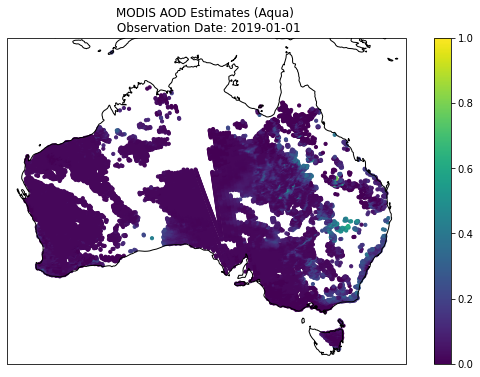

In [60]:
plt.figure(figsize=(10,6))
ax = plt.axes(projection=ccrs.PlateCarree())
plt.scatter(df_H8_MODIS['lon'], df_H8_MODIS['lat'], c=df_H8_MODIS['AOD_550_Dark_Target_Deep_Blue_Combined'], vmin=0, vmax=1, s=10)
plt.colorbar()
ax.coastlines()
ax.set_title(f'MODIS AOD Estimates (Aqua) \n Observation Date: {PARAM_DATE}')
plt.savefig(f'../../presentation_modis_aqua.png', facecolor='white', bbox_inches='tight')
plt.show()